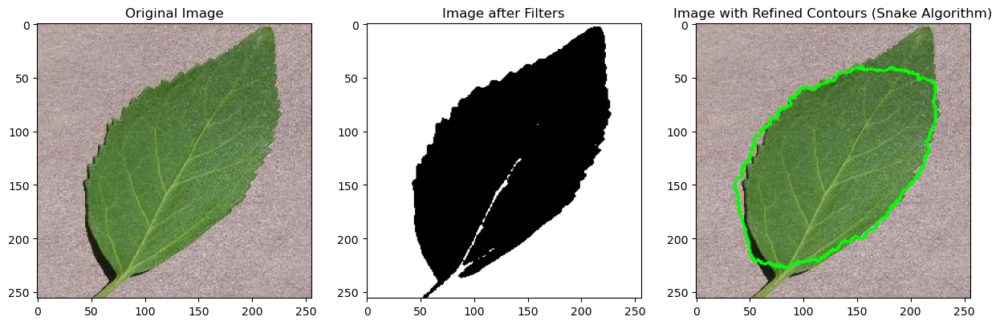

[array([[[201,  45],
         [199,  46],
         [198,  45],
         [197,  44],
         [195,  43],
         [194,  44],
         [192,  43],
         [190,  43],
         [188,  43],
         [187,  43],
         [186,  43],
         [185,  42],
         [184,  42],
         [183,  41],
         [181,  41],
         [180,  42],
         [178,  43],
         [177,  43],
         [175,  44],
         [174,  44],
         [172,  43],
         [170,  43],
         [169,  44],
         [167,  43],
         [166,  43],
         [164,  42],
         [163,  42],
         [162,  42],
         [160,  43],
         [159,  42],
         [157,  43],
         [156,  42],
         [155,  40],
         [154,  41],
         [153,  42],
         [152,  42],
         [151,  41],
         [150,  41],
         [147,  42],
         [146,  42],
         [143,  45],
         [139,  46],
         [137,  45],
         [135,  46],
         [132,  46],
         [129,  53],
         [123,  53],
         [122

In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import active_contour

def extract_snake_contour(image):
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian blur to reduce noise and smooth the image
    blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)

    # Apply adaptive thresholding to obtain a binary image
    _, binary_image = cv2.threshold(blurred_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Perform edge detection using Canny
    edges = cv2.Canny(binary_image, 50, 150)

    # Apply morphological operations to extract external contours
    kernel = np.ones((5, 5), np.uint8)
    edges = cv2.dilate(edges, kernel, iterations=1)
    edges = cv2.erode(edges, kernel, iterations=1)

    # Find contours using cv2.findContours
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Apply active contour model to refine contours
    snake_contours = []
    for contour in contours:
        # Convert contour to (N, 2) format
        initial_contour = np.squeeze(contour)

        # Apply active contour model
        snake = active_contour(binary_image, initial_contour, alpha=0.1, beta=1.0, gamma=0.01)

        # Convert back to (1, N, 2) format
        snake_contours.append(snake.reshape(1, -1, 2).astype(int))

    # Plotting the results
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # Original Image
    axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0].set_title("Original Image")

    # Image after applying filters
    axes[1].imshow(binary_image, cmap='gray')
    axes[1].set_title("Image after Filters")

    # Image with refined contours
    image_with_snake = image.copy()
    cv2.drawContours(image_with_snake, snake_contours, -1, (0, 255, 0), 2)
    axes[2].imshow(cv2.cvtColor(image_with_snake, cv2.COLOR_BGR2RGB))
    axes[2].set_title("Image with Refined Contours (Snake Algorithm)")

    plt.show()

    return snake_contours

# Example usage
image_path = r'C:\Users\lg\Desktop\DataSet\Cherry\image (8).JPG'
image = cv2.imread(image_path)
extract_snake_contour(image)


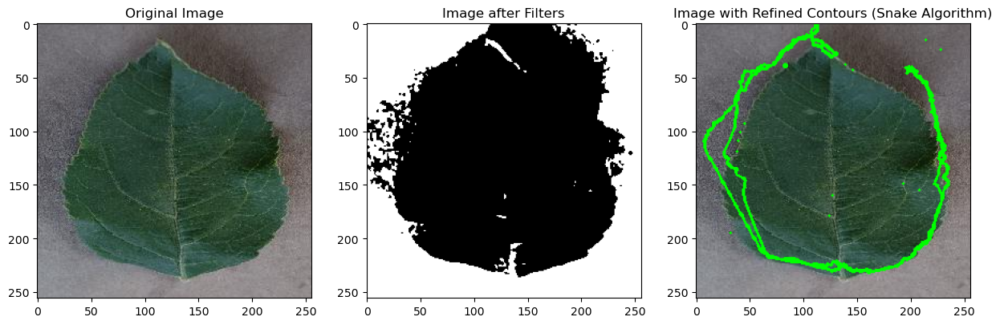

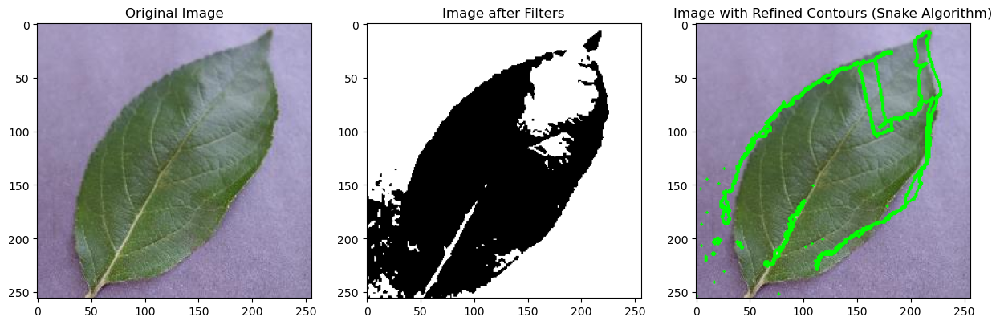

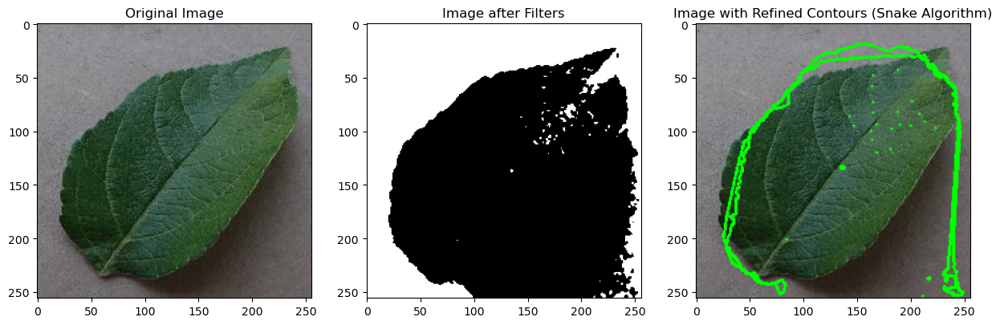

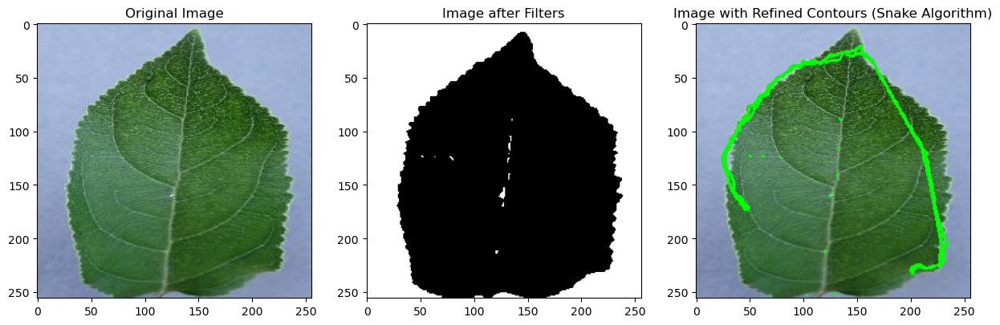

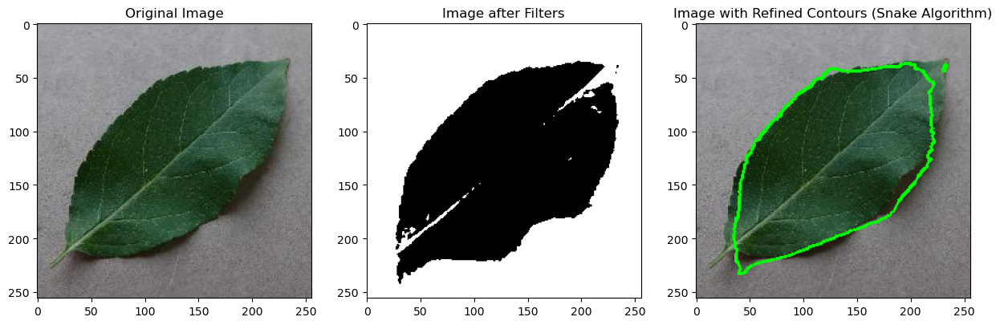

...

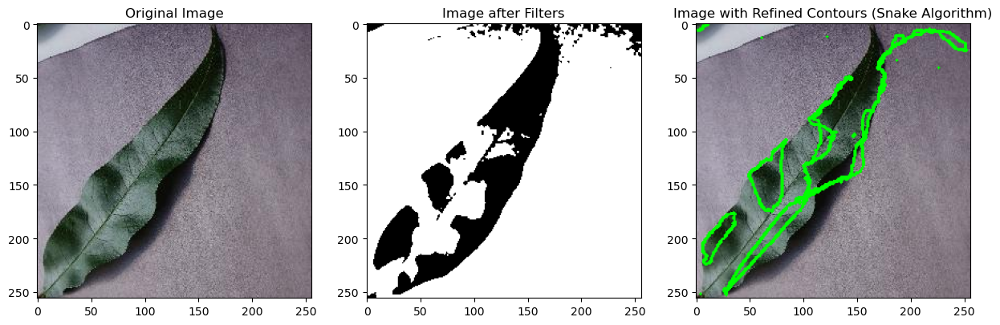

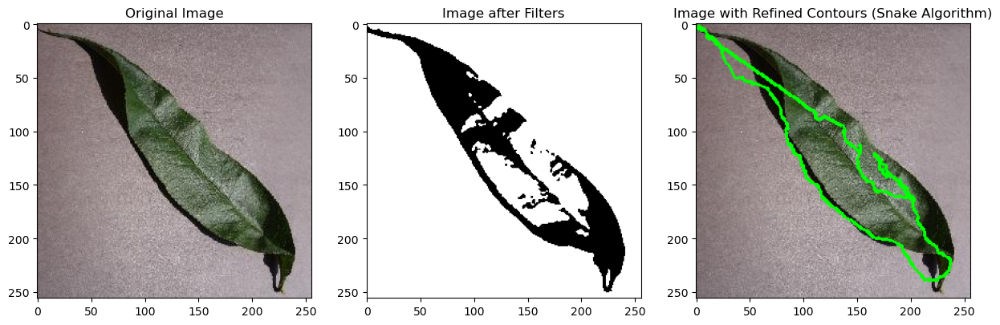

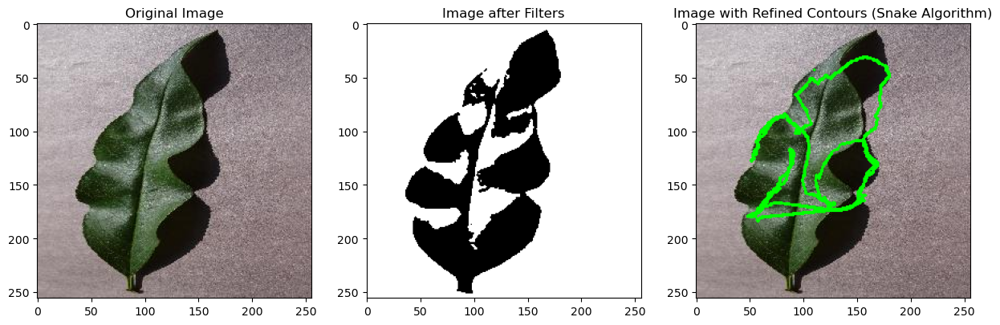

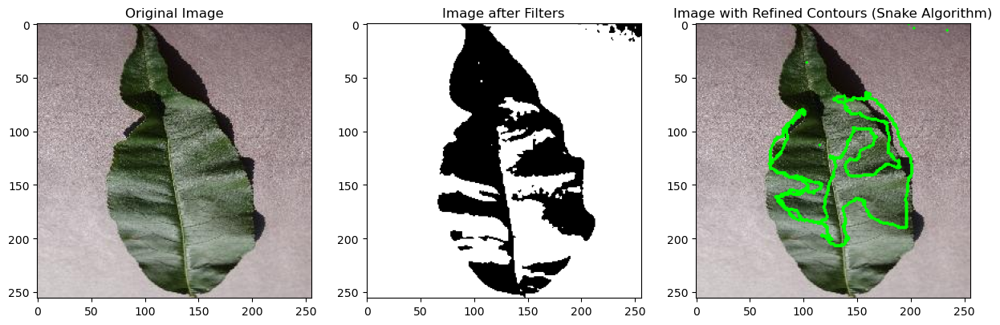

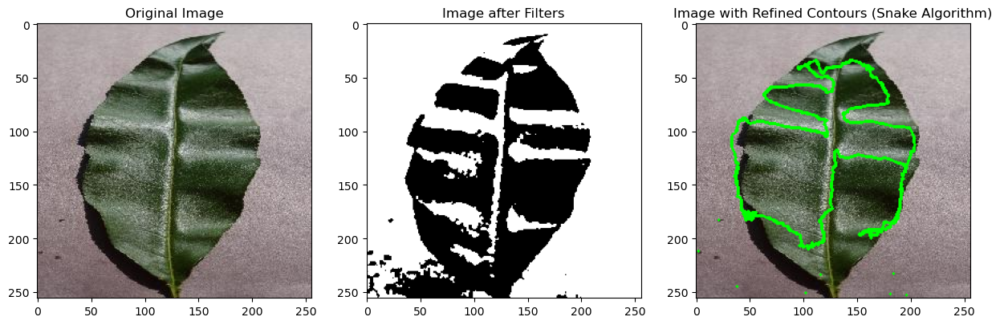

In [16]:
import os

# Modify your data collection loop to use the Snake approach with visualization
repertoire_images = r'C:\Users\lg\Desktop\Data'

data_dict_snake = {'contours': [], 'labels': []}

for dossier, sous_dossiers, fichiers in os.walk(repertoire_images):
    for fichier in fichiers:
        if fichier.lower().endswith(('.jpg', '.jpeg', '.png')):
            chemin_image = os.path.join(dossier, fichier)
            image = cv2.imread(chemin_image)
            
            # Extract Snake contours with visualization
            contours = extract_snake_contour(image)
            
            # Récupérer l'étiquette à partir du nom du dossier
            label = os.path.basename(dossier)

            # Ajouter les contours et l'étiquette au dictionnaire
            data_dict_snake['contours'].append(contours)
            data_dict_snake['labels'].append(label)


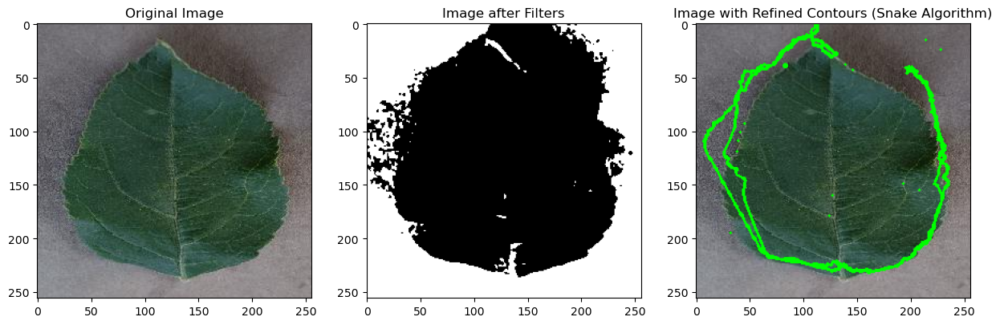

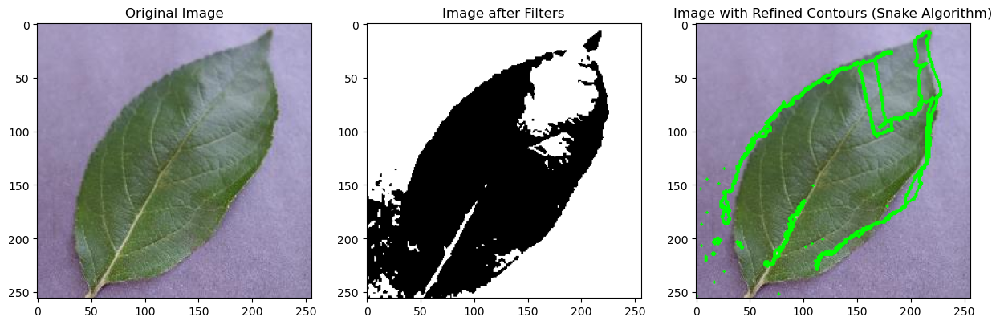

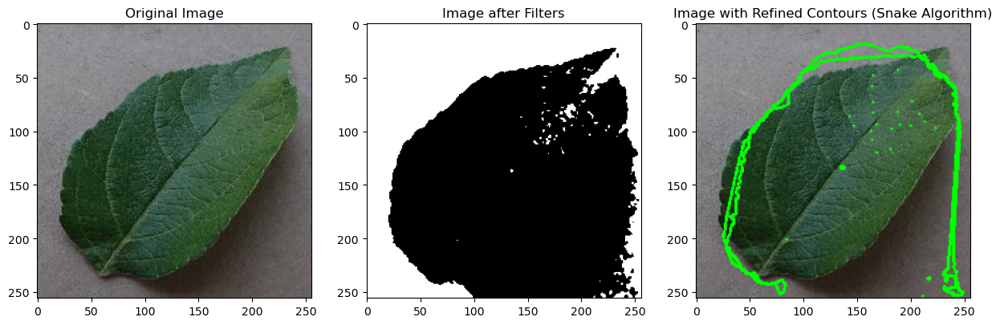

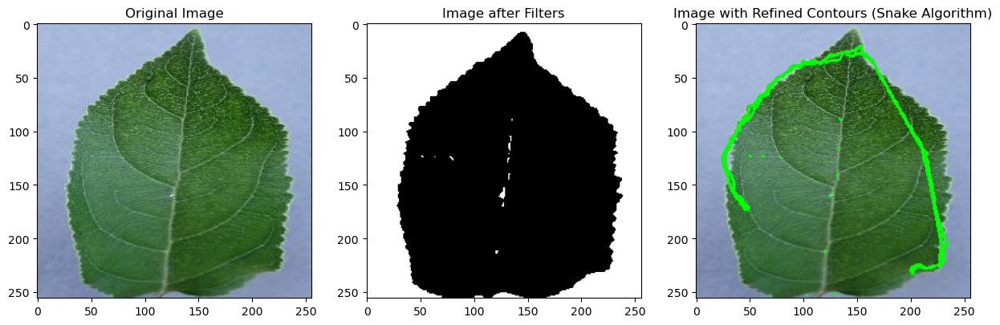

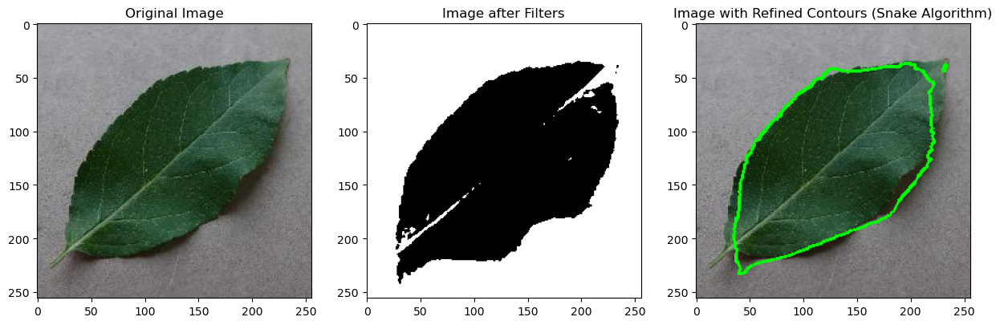

...

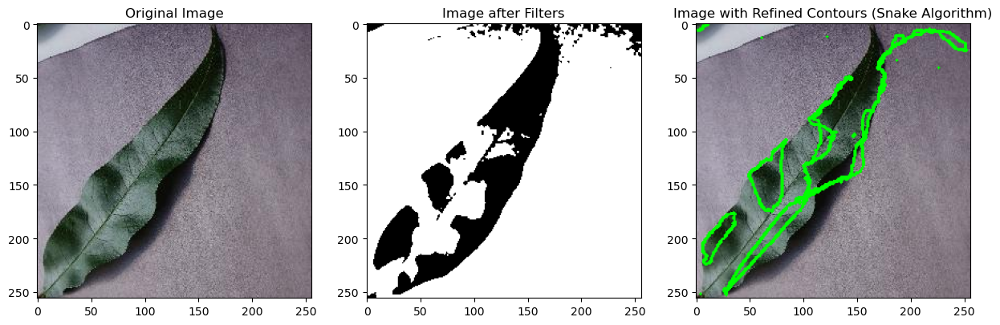

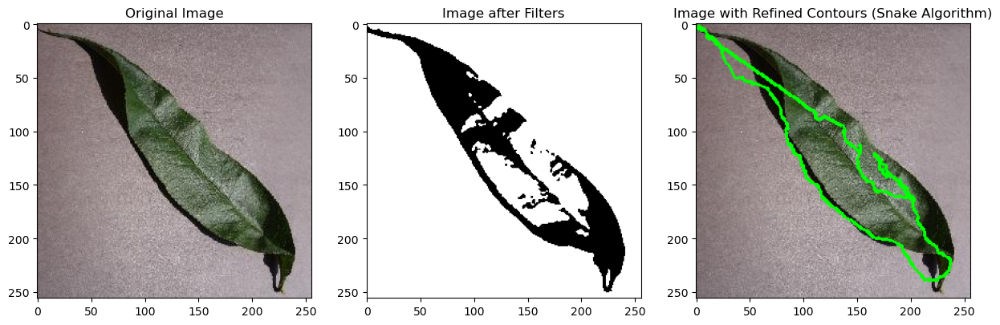

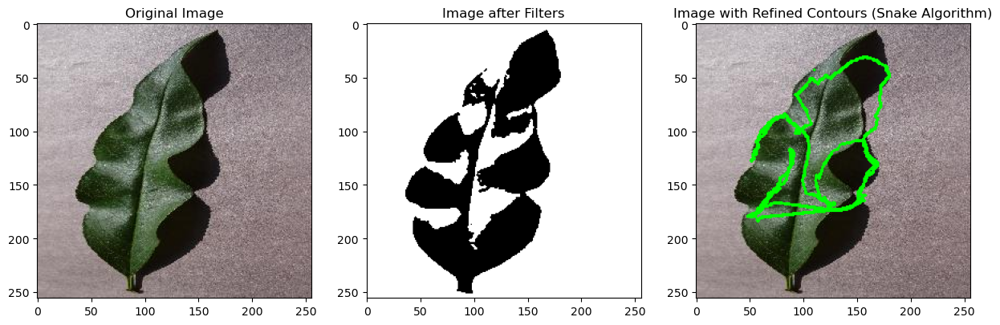

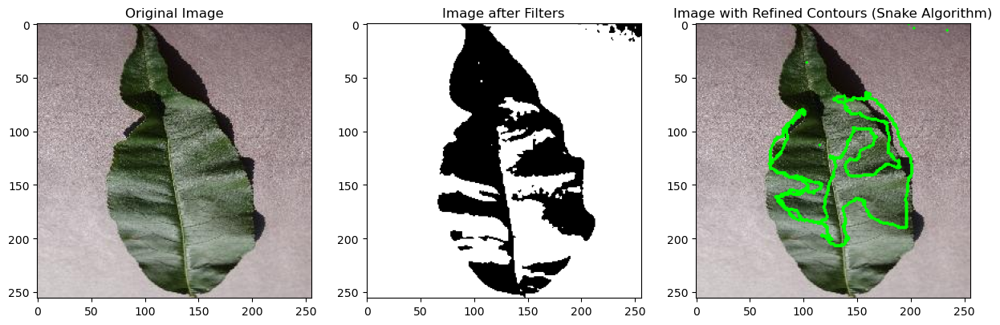

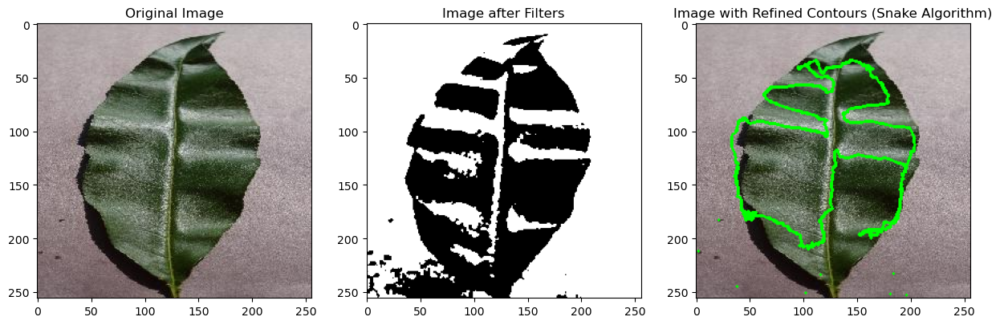

In [17]:
# Data collection loop

for dossier, sous_dossiers, fichiers in os.walk(repertoire_images):
    for fichier in fichiers:
        if fichier.lower().endswith(('.jpg', '.jpeg', '.png')):
            chemin_image = os.path.join(dossier, fichier)
            image = cv2.imread(chemin_image)
            
            # Extract Snake contours
            contours = extract_snake_contour(image)
            
            # Récupérer l'étiquette à partir du nom du dossier
            label = os.path.basename(dossier)

            # Ajouter les contours et l'étiquette au dictionnaire
            data_dict_snake['contours'].extend(contours)
            data_dict_snake['labels'].extend([label] * len(contours))


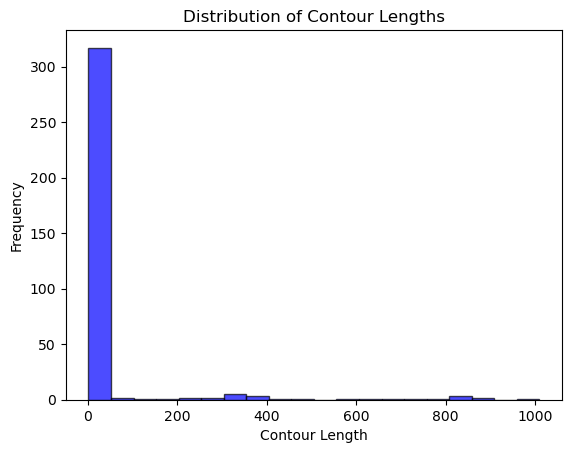

In [18]:
# Data analysis
# Extract contour lengths
contour_lengths = [len(contour[0]) for contours_list in data_dict_snake['contours'] for contour in contours_list]

# Plot histogram of contour lengths
plt.hist(contour_lengths, bins=20, color='blue', edgecolor='black', alpha=0.7)
plt.title('Distribution of Contour Lengths')
plt.xlabel('Contour Length')
plt.ylabel('Frequency')
plt.show()

In [23]:
# Data preprocessing
# Resize images to a common size
target_size = (100, 100)
resized_contours = []

for contours_list in data_dict_snake['contours']:
    for contour in contours_list:
        try:
            resized_contour = cv2.resize(contour[0], target_size)
            resized_contours.append(resized_contour)
        except Exception as e:
            print(f"Error resizing contour: {e}")

data_dict_snake['contours'] = resized_contours

In [24]:
data_dict_snake['contours']

[]